# Cities Cluster Distribution Analysis by Venues Data

M.Shumskiy  
12/08/2020

## Table of Contents

* [1 Introduction](#chapter1)
* [2 Methodology](#chapter1)
    * [2.1 The Data](#section_2_1)
    * [2.2 The Code](#Section_2_2)
        * [2.2.1 Abrantes](#section_2_2_1)
        * [2.2.2 Tomar](#section_2_2_2)
        * [2.2.3 Porto ](#section_2_2_3)
* [3 Results](#chapter3)
    * [3.1 Abrantes](#section_3_1)
    * [3.2 Tomar](#section_3_2)
    * [3.3 Porto](#section_3_2)
* [4 Discussion](#chapter4)
    * [4.1 Abrantes](#section_4_1)
    * [4.2 Tomar](#section_4_2)
    * [4.3 Porto](#section_4_2)
* [5 Conclusion](#chapter5)
* [6 References Results](#chapter6)
* [7 Acknowledgements](#chapter7)

## Abstract

The type of venues that are expected to be found in each region seem to be related to some paramenters.  
In this project, we analyze the venues from each region (parish), cluster them and explore the relation between cluster geographical distribution and the region data.  
The objective is to analyze the cities' dynamics based on venues data and, most importantly, to find which region parameter influences more the type of venues found there.  
In this project I clustered the regions based on their venues data.  
There was also observed an interesting phenomenom, the cluster propagation.

## 1 Introduction <a class="anchor" id="chapter1"></a>

This project was an assignment of IBM Data Science Professional Certification. The purpose of the project was to use Foursquare API to Segment and Cluster Regions based of the most common venues of each region. I decided to apply this method to 3 cities of Portugal, 2 more rural cities and one urban (Porto city).  
All of these 3 cities I am familiar with, therefore it seemed to be interesting to study their dynamics and compare them.  
The cities have an intrinsic dynamic of the venues distriution, which may vary from region to region. The more central ones are expected to differ from the more peripheral ones. However, what affects more this distribution? Is it unemployment, average age, population density, or plain distance to the center of the city? By comparing all of these parameters we can find some interesting results that give an insight to the city dynamics in relation to venue distribution.

## 2 Methodology <a class="anchor" id="chapter2"></a>

To perform this analysis I used python as a programming language, gathered geographical data in form of a JSON file found in Spatial Data Repository of NYU, and region data from portuguese institute of statistics.  
First I had to edit the JSON file to clean data of parishes borders, then I gathered information of each parish such as unemployment, average age and population density. Then I performed an analysis on the cities of Abrantes, Tomar and Porto using the Foursquare API, clustering using KMeans algorithm and then comparing he cluster distribution in relation to the parish data.

### 2.1 The Data <a class="anchor" id="section_2_1"></a>

The data I used was:  
* Data of the parishes borders in JSON format found in Spatial Data Repository of NYU (https://geo.nyu.edu/catalog/stanford-jt394dz4777);  
* Region data found in Portuguese Institute of Statistics (https://www.ine.pt/xportal/xmain?xpid=INE&xpgid=ine_main);  
* Used Foursquare API to get the most common venues in the cities subject to analysis;  
* Google earth to search for the coordinates of the center of each region based on the center relevance.


### 2.2 The Code <a class="anchor" id="section_2_2"></a>

This section will show and explore the code I used to conduct the analysis.

Importation of the needed libraries.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you dont have it installed
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you dont have it installed
import folium # map rendering library


Foursquare credentials

In [2]:
CLIENT_ID = 'CALYJZ5X1YJIUSGJZDZ3QRZFNQPYVCNRMDGK0H5JQLFPQJK2' # your Foursquare ID
CLIENT_SECRET = '2WLM3YOORX5TN0EFJSR0N1PQH514CQPD2LTFOHHZY1N1FRVO' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100

This function retrieves nearby venues from Foursquare

In [3]:
def getNearbyVenues(names, lat, lng, distance):
    
    venues_list=[]
    for name, lat, lng, distance in zip(names, lat, lng, distance):
        
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            distance, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['parish', 
                  'freg lat', 
                  'freg lng', 
                  'Venue', 
                  'Venue lat', 
                  'Venue lng', 
                  'Venue cat']
    
    return(nearby_venues)

Now that we heve the general part of the code, we can get to the specifics.  
We will start with Abrantes.

#### 2.2.1 Abrantes <a class="anchor" id="section_2_1_1"></a>

JSON file importation.

In [4]:
abrantes= r'C:\Users\Pc\Desktop\Project\abrantes5.json'
with open(abrantes) as ab:
    ab_data=ab.readlines()
    ab_data=[json.loads(line) for line in ab_data]
ab_data=ab_data[0]
with open(abrantes) as ab:
    abr = json.load(ab)
# Append a tooltip column with customised text
tooltip_text=[]
for idx in range(19):
    tooltip_text.append(ab_data['features'][idx]['properties'])

Excel file with region (parish) data importation.

In [5]:
coord_abrantes=r'C:\Users\Pc\Desktop\Project\abrantes.xlsx'
df_abrantes = pd.read_excel(coord_abrantes)
df_abrantes=df_abrantes.drop(columns=['id'])
print('the data size is: ' + str(df_abrantes.shape))
df_abrantes.head()

the data size is: (19, 7)


,parish,average age,unemployment,lat,lng,distance,pop density
0,Aldeia Do Mato,57.63,15.10,39.542768,-8.271967,700,17.8
1,Alferrarede,43.87,11.67,39.482227,-8.179739,1460,162.2
2,Alvega,50.13,19.07,39.465386,-8.045158,700,30.6
3,Bemposta,50.87,12.82,39.352765,-8.139307,700,12.0
4,Martinchel,52.02,14.87,39.538761,-8.297649,1150,41.7


Here you can see part of the data relative to 19 parishes of Abrantes. We will use average age, unemployment rate and population density.  
The coordinates indicate the location around which will be gathered venues information for each parish.  
Note that the location of these points does not represent the geographical center of the parish, but rather a geographical point around which makes most sense to gather venue's information (i.e. makes no sense to look for venues in not populated areas such as forests).

Now we can start to gather venue information.

In [6]:
abrantes_venues = getNearbyVenues(names=df_abrantes['parish'],
                                  lat=df_abrantes['lat'],
                                  lng=df_abrantes['lng'],
                                  distance=df_abrantes['distance'])

This is the result of the search (note that not all the data is displayed in this table for sake of space economy).

In [7]:
print(abrantes_venues.shape)
abrantes_venues.head()

(73, 7)


,parish,freg lat,freg lng,Venue,Venue lat,Venue lng,Venue cat
0,Aldeia Do Mato,39.542768,-8.271967,Praia Aldeia do Mato,39.543798,-8.275580,Beach
1,Aldeia Do Mato,39.542768,-8.271967,Quinta Da Eira Velha,39.542930,-8.272497,Bed & Breakfast
2,Aldeia Do Mato,39.542768,-8.271967,Segredos de Aldeia,39.545368,-8.277282,Hotel
3,Aldeia Do Mato,39.542768,-8.271967,Cabana do Rio,39.545476,-8.277229,Café
4,Alferrarede,39.482227,-8.179739,Cascata,39.484379,-8.190833,Diner


Sampled a total of 76 venues.

In [8]:
abrantes_venues.groupby('parish').count()

,freg lat,freg lng,Venue,Venue lat,Venue lng,Venue cat
parish,,,,,,
Aldeia Do Mato,4,4,4,4,4,4
Alferrarede,4,4,4,4,4,4
Alvega,2,2,2,2,2,2
Bemposta,2,2,2,2,2,2
Carvalhal,3,3,3,3,3,3
Concavada,1,1,1,1,1,1
Fontes,2,2,2,2,2,2
Martinchel,2,2,2,2,2,2
Mouriscas,1,1,1,1,1,1


The above table shows the number of venues gathered for each parish.

Now we perform one-hot encoding to allow the KMeans algorithm to do his job.

In [9]:
# one hot encoding
abrantes_onehot = pd.get_dummies(abrantes_venues[['Venue cat']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
abrantes_onehot['parish'] = abrantes_venues['parish'] 

# move neighborhood column to the first column
fixed_columns = [abrantes_onehot.columns[-1]] + list(abrantes_onehot.columns[:-1])
abrantes_onehot = abrantes_onehot[fixed_columns]

print(abrantes_onehot.shape)
abrantes_onehot.head()

(73, 32)


,parish,Arts & Crafts Store,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery,Café,Diner,Dumpling Restaurant,Electronics Store,Food Truck,Gas Station,Grocery Store,Historic Site,Hotel,Outdoors & Recreation,Park,Pharmacy,Pizza Place,Plaza,Portuguese Restaurant,Restaurant,River,Scenic Lookout,Shopping Mall,Snack Place,Soccer Field,Sporting Goods Shop,Steakhouse,Supermarket,Train Station
0,Aldeia Do Mato,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Aldeia Do Mato,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Aldeia Do Mato,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Aldeia Do Mato,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Alferrarede,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


And transform the the table into one that givesthe information in a more relevant format.

In [10]:
abrantes_grouped = abrantes_onehot.groupby('parish').mean().reset_index()
print(abrantes_grouped.shape)
abrantes_grouped

(19, 32)


,parish,Arts & Crafts Store,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery,Café,Diner,Dumpling Restaurant,Electronics Store,Food Truck,Gas Station,Grocery Store,Historic Site,Hotel,Outdoors & Recreation,Park,Pharmacy,Pizza Place,Plaza,Portuguese Restaurant,Restaurant,River,Scenic Lookout,Shopping Mall,Snack Place,Soccer Field,Sporting Goods Shop,Steakhouse,Supermarket,Train Station
0,Aldeia Do Mato,0.00,0.000000,0.25,0.25,0.0,0.000000,0.250000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.250000,0.00,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0
1,Alferrarede,0.25,0.000000,0.00,0.00,0.0,0.000000,0.000000,0.250000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.25,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.250000,0.0
2,Alvega,0.00,0.000000,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.500000,0.000000,0.000000,0.0,0.000000,0.500000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0
3,Bemposta,0.00,0.000000,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0
4,Carvalhal,0.00,0.000000,0.00,0.00,0.0,0.000000,0.333333,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.333333,0.333333,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0
5,Concavada,0.00,0.000000,0.00,0.00,1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0
6,Fontes,0.00,0.000000,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.5,0.500000,0.000000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0
7,Martinchel,0.00,0.000000,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.500000,0.00,0.000000,0.000000,0.000000,0.0,0.000000,0.500000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0
8,Mouriscas,0.00,0.000000,0.00,0.00,0.0,0.000000,1.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0
9,Pego,0.00,0.000000,0.00,0.00,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.2,0.200000,0.600000,0.00,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.000000,0.0


Now we will sample the most common venues in each parish.  
First we must define the function that extracts the most common venues.

In [11]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [12]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['parish']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['parish'] = abrantes_grouped['parish']

for ind in np.arange(abrantes_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(abrantes_grouped.iloc[ind, :], num_top_venues)


To not make this article too extensive, we will display the results of the previous cell after the KMeans algorithm does his job.

In [13]:
# set number of clusters
kclusters = 6 #run algorithm to choose best

abrantes_grouped_clustering = abrantes_grouped.drop('parish', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(abrantes_grouped_clustering)

In [14]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
#neighborhoods_venues_sorted.head()
abrantes_merged = df_abrantes
abrantes_merged.columns=['parish','average age','unemployment','lat','lng','distance','pop density']

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
abrantes_merged.set_index('parish')
abrantes_merged = abrantes_merged.join(neighborhoods_venues_sorted.set_index('parish'), on='parish')

abrantes_merged

,parish,average age,unemployment,lat,lng,distance,pop density,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Aldeia Do Mato,57.63,15.10,39.542768,-8.271967,700,17.8,0,Hotel,Beach,Bed & Breakfast,Café,Train Station,Bar,Breakfast Spot,Brewery,Diner,Dumpling Restaurant
1,Alferrarede,43.87,11.67,39.482227,-8.179739,1460,162.2,0,Outdoors & Recreation,Supermarket,Diner,Arts & Crafts Store,Soccer Field,Grocery Store,Bar,Beach,Bed & Breakfast,Breakfast Spot
2,Alvega,50.13,19.07,39.465386,-8.045158,700,30.6,1,Restaurant,Park,Train Station,Historic Site,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery,Café
3,Bemposta,50.87,12.82,39.352765,-8.139307,700,12.0,1,Restaurant,Train Station,Hotel,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery,Café,Diner
4,Martinchel,52.02,14.87,39.538761,-8.297649,1150,41.7,1,Hotel,Restaurant,Train Station,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery,Café,Diner
5,Mouriscas,54.18,14.83,39.507848,-8.100109,1500,55.6,3,Café,Train Station,Hotel,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery,Diner,Dumpling Restaurant
6,Pego,47.36,15.06,39.461812,-8.148756,700,71.2,1,Restaurant,Plaza,Portuguese Restaurant,Train Station,Gas Station,Food Truck,Electronics Store,Dumpling Restaurant,Diner,Historic Site
7,Rio De Moinhos,47.64,12.83,39.484819,-8.250202,1790,69.2,0,Steakhouse,Café,Portuguese Restaurant,Train Station,Historic Site,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery
8,Rossio Ao Sul Do Tejo,45.24,14.98,39.444332,-8.185909,860,337.0,0,Train Station,Soccer Field,River,Dumpling Restaurant,Food Truck,Historic Site,Bar,Beach,Bed & Breakfast,Breakfast Spot
9,S. Facundo,52.58,20.98,39.374582,-8.104571,700,14.5,5,Café,Plaza,Train Station,Hotel,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery,Diner


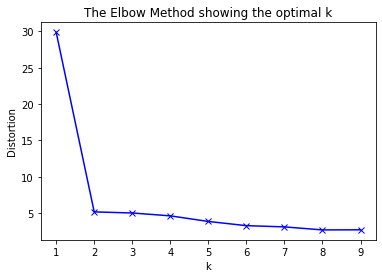

In [15]:
from scipy.spatial.distance import cdist

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(abrantes_grouped_clustering)
    #kmeanModel.fit(istanbul_grouped_clustering)
    distortions.append(sum(np.min(cdist(abrantes_grouped_clustering, kmeanModel.cluster_centers_, 'canberra'), axis=1)) / abrantes_grouped_clustering.shape[0])


# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

Now we have our full dataset for abrantes city.  
I had to push the limits by choosing number of clusters to be 6 because otherwise I would end up with little cluster diversity.

In [16]:
threshold_scale = np.linspace(abrantes_merged['unemployment'].min(),
                              abrantes_merged['unemployment'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_abrantes_unemployment = folium.Map(location=[39.464805,-8.199648], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = abr,
    name = 'choropleth',
    data = abrantes_merged,
    columns = ['parish','unemployment'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='unemployment %',
    #reset=True
    
    
).add_to(map_clusters_abrantes_unemployment)
folium.LayerControl().add_to(map_clusters_abrantes_unemployment)
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_abrantes_unemployment)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(abrantes_merged['lat'],
                                  abrantes_merged['lng'],
                                  abrantes_merged['parish'],
                                  abrantes_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_abrantes_unemployment)
       


In [17]:
threshold_scale = np.linspace(abrantes_merged['average age'].min(),
                              abrantes_merged['average age'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_abrantes_age = folium.Map(location=[39.464805,-8.199648], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = abr,
    name = 'choropleth',
    data = abrantes_merged,
    columns = ['parish','average age'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='average age',
    #reset=True
    
    
).add_to(map_clusters_abrantes_age)
folium.LayerControl().add_to(map_clusters_abrantes_age)
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_abrantes_age)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(abrantes_merged['lat'],
                                  abrantes_merged['lng'],
                                  abrantes_merged['parish'],
                                  abrantes_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_abrantes_age)
       


In [18]:
threshold_scale = np.linspace(abrantes_merged['pop density'].min(),
                              abrantes_merged['pop density'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_abrantes_denspop = folium.Map(location=[39.464805,-8.199648], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = abr,
    name = 'choropleth',
    data = abrantes_merged,
    columns = ['parish','pop density'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='population density (Residents per km^2)',
    #reset=True
    
    
).add_to(map_clusters_abrantes_denspop)
folium.LayerControl().add_to(map_clusters_abrantes_denspop)
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_abrantes_denspop)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(abrantes_merged['lat'],
                                  abrantes_merged['lng'],
                                  abrantes_merged['parish'],
                                  abrantes_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_abrantes_denspop)
       


#### 2.2.2 Tomar <a class="anchor" id="section_2_2_2"></a>

The process is analogous to Abrantes, so I will not explain every part of the code here.

In [19]:
tomar= r'C:\Users\Pc\Desktop\Project\tomar.json'
with open(tomar) as tm:
    tmr = json.load(tm)
with open(tomar) as tm:
    tm_data=tm.readlines()
    tm_data=[json.loads(line) for line in tm_data]
tm_data=tm_data[0]
tooltip_text=[]
for idx in range(16):
    tooltip_text.append(tm_data['features'][idx]['properties'])
coord_tomar=r'C:\Users\Pc\Desktop\Project\tomar.xlsx'
df_tomar = pd.read_excel(coord_tomar)

In [20]:
tomar_venues = getNearbyVenues(names=df_tomar['parish'],
                                  lat=df_tomar['lat'],
                                  lng=df_tomar['lng'],
                                  distance=df_tomar['distance'])
print(tomar_venues.shape)
tomar_venues.head()

(59, 7)


,parish,freg lat,freg lng,Venue,Venue lat,Venue lng,Venue cat
0,Asseiceira,39.514217,-8.376939,Luria,39.539771,-8.369542,Restaurant
1,Asseiceira,39.514217,-8.376939,Café Barata,39.490848,-8.372830,Diner
2,Asseiceira,39.514217,-8.376939,Moto2T - Oficina,39.529915,-8.403037,Motorcycle Shop
3,Asseiceira,39.514217,-8.376939,Grill House,39.486006,-8.389581,Portuguese Restaurant
4,Carregueiros,39.618152,-8.445045,Carregueiros,39.623952,-8.440740,Outdoors & Recreation


In [21]:
tomar_venues.groupby('parish').count()

,freg lat,freg lng,Venue,Venue lat,Venue lng,Venue cat
parish,,,,,,
Alem Da Ribeira,2,2,2,2,2,2
Asseiceira,4,4,4,4,4,4
Carregueiros,2,2,2,2,2,2
Casais,4,4,4,4,4,4
Junceira,1,1,1,1,1,1
Madalena,3,3,3,3,3,3
Olalhas,4,4,4,4,4,4
Paialvo,5,5,5,5,5,5
Pedreira,1,1,1,1,1,1


In [22]:
# one hot encoding
tomar_onehot = pd.get_dummies(tomar_venues[['Venue cat']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
tomar_onehot['parish'] = tomar_venues['parish'] 

# move neighborhood column to the first column
fixed_columns = [tomar_onehot.columns[-1]] + list(tomar_onehot.columns[:-1])
tomar_onehot = tomar_onehot[fixed_columns]

print(abrantes_onehot.shape)
abrantes_onehot.head()

(73, 32)


,parish,Arts & Crafts Store,Bar,Beach,Bed & Breakfast,Breakfast Spot,Brewery,Café,Diner,Dumpling Restaurant,Electronics Store,Food Truck,Gas Station,Grocery Store,Historic Site,Hotel,Outdoors & Recreation,Park,Pharmacy,Pizza Place,Plaza,Portuguese Restaurant,Restaurant,River,Scenic Lookout,Shopping Mall,Snack Place,Soccer Field,Sporting Goods Shop,Steakhouse,Supermarket,Train Station
0,Aldeia Do Mato,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Aldeia Do Mato,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Aldeia Do Mato,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Aldeia Do Mato,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Alferrarede,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [23]:
tomar_grouped = tomar_onehot.groupby('parish').mean().reset_index()
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['parish']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_tomar = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_tomar['parish'] = tomar_grouped['parish']

for ind in np.arange(tomar_grouped.shape[0]):
    neighborhoods_venues_sorted_tomar.iloc[ind, 1:] = return_most_common_venues(tomar_grouped.iloc[ind, :], num_top_venues)
    
# set number of clusters
kclusters = 6 #run algorithm to choose best

tomar_grouped_clustering = tomar_grouped.drop('parish', 1)

# run k-means clustering
kmeanst = KMeans(n_clusters=kclusters, random_state=0).fit(tomar_grouped_clustering)

# add clustering labels
neighborhoods_venues_sorted_tomar.insert(0, 'Cluster Labels', kmeanst.labels_)
#neighborhoods_venues_sorted.head()
tomar_merged = df_tomar
tomar_merged.columns=['parish','average age','unemployment','lat','lng','distance','pop density']

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
tomar_merged.set_index('parish')
tomar_merged = tomar_merged.join(neighborhoods_venues_sorted_tomar.set_index('parish'), on='parish')
tomar_merged=tomar_merged.drop([0,2,13])

tomar_merged # check the last columns!

,parish,average age,unemployment,lat,lng,distance,pop density,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Asseiceira,45.75,13.77,39.514217,-8.376939,3320,101.3,5.0,Restaurant,Portuguese Restaurant,Diner,Motorcycle Shop,Wine Shop,Castle,Fried Chicken Joint,Food Service,Fast Food Restaurant,Coffee Shop
3,Carregueiros,44.50,13.39,39.618152,-8.445045,1000,95.5,4.0,Café,Outdoors & Recreation,Wine Shop,Coffee Shop,Garden,Fried Chicken Joint,Food Service,Fast Food Restaurant,Diner,Castle
4,Casais,45.41,15.93,39.648217,-8.369718,2480,85.6,5.0,Portuguese Restaurant,BBQ Joint,Restaurant,Wine Shop,Castle,Fried Chicken Joint,Food Service,Fast Food Restaurant,Diner,Coffee Shop
5,Junceira,45.15,13.94,39.610072,-8.333736,2060,68.1,2.0,Campground,Castle,Garden,Fried Chicken Joint,Food Service,Fast Food Restaurant,Diner,Coffee Shop,Wine Shop,Grocery Store
6,Madalena,44.30,11.86,39.560767,-8.431401,1350,105.7,5.0,Wine Shop,Food Service,Portuguese Restaurant,Castle,Garden,Fried Chicken Joint,Fast Food Restaurant,Diner,Coffee Shop,Campground
7,Olalhas,47.78,16.74,39.636974,-8.280190,1840,40.8,0.0,Park,Ice Cream Shop,Café,Music Venue,Wine Shop,Fried Chicken Joint,Food Service,Fast Food Restaurant,Diner,Coffee Shop
8,Paialvo,47.95,11.62,39.530585,-8.443525,2290,116.5,5.0,Train Station,Restaurant,Portuguese Restaurant,Platform,Café,Wine Shop,Castle,Food Service,Fast Food Restaurant,Diner
9,Pedreira,48.58,10.29,39.640897,-8.408744,910,45.5,1.0,River,Wine Shop,Castle,Garden,Fried Chicken Joint,Food Service,Fast Food Restaurant,Diner,Coffee Shop,Campground
10,Santa Maria Dos Olivais,43.93,12.70,39.605706,-8.389200,1880,930.5,0.0,Café,Brewery,Grocery Store,Fast Food Restaurant,Coffee Shop,Pet Store,Gastropub,Restaurant,Supermarket,Bistro
11,S. Joao Baptista,44.48,12.70,39.596016,-8.418222,960,426.6,0.0,Bakery,Portuguese Restaurant,Café,Castle,Garden,Italian Restaurant,Train,Restaurant,Plaza,Bistro


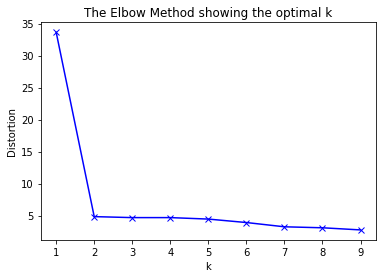

In [24]:
from scipy.spatial.distance import cdist

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(tomar_grouped_clustering)
    #kmeanModel.fit(istanbul_grouped_clustering)
    distortions.append(sum(np.min(cdist(tomar_grouped_clustering, kmeanModel.cluster_centers_, 'canberra'), axis=1)) / tomar_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

Here I also had to choose a higher number of clusters for the same reason that I did for Abrantes, i.e. to get some cluster diversity.

Here we have Tomar dataset. Note that some regions had to be dropped because of the lack of venue data.

In [25]:
threshold_scale = np.linspace(tomar_merged['unemployment'].min(),
                              tomar_merged['unemployment'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_tomar_unemployment = folium.Map(location=[39.602530,-8.409337], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = tmr,
    name = 'choropleth',
    data = tomar_merged,
    columns = ['parish','unemployment'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='unemployment %',
    #reset=True
    
    
).add_to(map_clusters_tomar_unemployment)
folium.LayerControl().add_to(map_clusters_tomar_unemployment)
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_tomar_unemployment)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(tomar_merged['lat'],
                                  tomar_merged['lng'],
                                  tomar_merged['parish'],
                                  tomar_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(int(cluster)), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters_tomar_unemployment)
       


In [26]:
threshold_scale = np.linspace(tomar_merged['average age'].min(),
                              tomar_merged['average age'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_tomar_age = folium.Map(location=[39.602530,-8.409337], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = tmr,
    name = 'choropleth',
    data = tomar_merged,
    columns = ['parish','average age'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='average age',
    #reset=True
    
    
).add_to(map_clusters_tomar_age)
folium.LayerControl().add_to(map_clusters_tomar_age)
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_tomar_age)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(tomar_merged['lat'],
                                  tomar_merged['lng'],
                                  tomar_merged['parish'],
                                  tomar_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(int(cluster)), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters_tomar_age)


In [27]:
threshold_scale = np.linspace(tomar_merged['pop density'].min(),
                              tomar_merged['pop density'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_tomar_popdens = folium.Map(location=[39.602530,-8.409337], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = tmr,
    name = 'choropleth',
    data = tomar_merged,
    columns = ['parish','pop density'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='population density (Residents per km^2)',
    #reset=True
    
    
).add_to(map_clusters_tomar_popdens)
folium.LayerControl().add_to(map_clusters_tomar_popdens)
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_tomar_popdens)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(tomar_merged['lat'],
                                  tomar_merged['lng'],
                                  tomar_merged['parish'],
                                  tomar_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(int(cluster)), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters_tomar_popdens)
       

#### 2.2.3 Porto <a class="anchor" id="section_2_2_3"></a>

In [28]:
porto= r'C:\Users\Pc\Desktop\Project\porto.json'
with open(porto) as pt:
    prt = json.load(pt)
with open(porto) as pt:
    pt_data=pt.readlines()
    pt_data=[json.loads(line) for line in pt_data]
pt_data=pt_data[0]
tooltip_text=[]
for idx in range(78):
    tooltip_text.append(pt_data['features'][idx]['properties'])
coord_porto=r'C:\Users\Pc\Desktop\Project\porto.xlsx'
df_porto = pd.read_excel(coord_porto)
df_porto.head()

,parish,average age,unemployment,lat,lng,distance,pop density
0,Aguas Santas,38.52,14.98,41.208444,-8.569747,973.0,3339.5
1,Aldoar,43.23,13.20,41.169869,-8.668785,899.0,5333.2
2,Arcozelo,39.99,16.07,41.051313,-8.642118,1164.0,1689.4
3,Avintes,41.08,21.32,41.109740,-8.553368,1385.0,1303.3
4,Avioso (Santa Maria),36.85,14.05,41.264489,-8.609436,599.0,924.6


In [29]:
porto_venues = getNearbyVenues(names=df_porto['parish'],
                                  lat=df_porto['lat'],
                                  lng=df_porto['lng'],
                                  distance=df_porto['distance'])
# one hot encoding
porto_onehot = pd.get_dummies(porto_venues[['Venue cat']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
porto_onehot['parish'] = porto_venues['parish'] 

# move neighborhood column to the first column
fixed_columns = [porto_onehot.columns[-1]] + list(porto_onehot.columns[:-1])
porto_onehot = porto_onehot[fixed_columns]

print(porto_onehot.shape)

(2198, 220)


In [30]:
porto_grouped = porto_onehot.groupby('parish').mean().reset_index()
print(porto_grouped.shape)
porto_grouped.head()

(77, 220)


,parish,Accessories Store,African Restaurant,Airport,Airport Service,American Restaurant,Aquarium,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bar,Basketball Court,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Board Shop,Boarding House,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Building,Burger Joint,Cafeteria,Café,Camera Store,Campground,Candy Store,Castle,Cemetery,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,Comfort Food Restaurant,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Dessert Shop,Diner,Dive Bar,Dumpling Restaurant,Dutch Restaurant,Duty-free Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Event Space,Exhibit,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Truck,Fried Chicken Joint,Frozen Yogurt Shop,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General College & University,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health Food Store,Heliport,Historic Site,History Museum,Hockey Arena,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Italian Restaurant,Japanese Restaurant,Karaoke Bar,Light Rail Station,Lighthouse,Liquor Store,Lounge,Market,Martial Arts School,Mediterranean Restaurant,Men's Store,Metro Station,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monastery,Monument / Landmark,Motel,Movie Theater,Multiplex,Museum,Music Venue,Nature Preserve,Neighborhood,Nightclub,Nightlife Spot,Noodle House,Optical Shop,Organic Grocery,Other Great Outdoors,Paintball Field,Palace,Paper / Office Supplies Store,Park,Pastelaria,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Pet Store,Pharmacy,Pier,Pizza Place,Planetarium,Platform,Playground,Plaza,Pool,Pool Hall,Port,Portuguese Restaurant,Pub,Rental Car Location,Resort,Restaurant,River,Rock Climbing Spot,Roof Deck,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Seafood Restaurant,Shoe Repair,Shoe Store,Shop & Service,Shopping Mall,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,Spa,Spanish Restaurant,Sporting Goods Shop,Sports Bar,Stables,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Syrian Restaurant,Tapas Restaurant,Taverna,Tea Room,Tennis Court,Theater,Theme Park,Theme Restaurant,Toll Plaza,Toy / Game Store,Trail,Train Station,Tram Station,Vacation Rental,Vegetarian / Vegan Restaurant,Volleyball Court,Water Park,Waterfront,Wine Bar,Wine Shop,Winery,Yoga Studio,Zoo
0,Aguas Santas,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.047619,0.0,0.095238,0.047619,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.142857,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.047619,0.0,0.0,0.0,0.0,0.0,0.047619,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.095238,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.047619,0.0,0.0,0.000,0.0,0.00,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.095238,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.047619,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.047619,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.047619,0.000000,0.0,0.0,0.0,0.0,0.0,0.047619,0.047619,0.095238,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [31]:
num_top_venues = 15

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['parish']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_porto = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_porto['parish'] = porto_grouped['parish']

for ind in np.arange(porto_grouped.shape[0]):
    neighborhoods_venues_sorted_porto.iloc[ind, 1:] = return_most_common_venues(porto_grouped.iloc[ind, :], num_top_venues)

# set number of clusters
kclusters = 6 #run algorithm to choose best

porto_grouped_clustering = porto_grouped.drop('parish', 1)

# run k-means clustering
kmeanst = KMeans(n_clusters=kclusters, random_state=0).fit(porto_grouped_clustering)

# add clustering labels
neighborhoods_venues_sorted_porto.insert(0, 'Cluster Labels', kmeanst.labels_)

porto_merged = df_porto
porto_merged.columns=['parish','average age','unemployment','lat','lng','distance','pop density']

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
porto_merged.set_index('parish')
porto_merged = porto_merged.join(neighborhoods_venues_sorted_porto.set_index('parish'), on='parish')
porto_merged=porto_merged.drop(39)
porto_merged.head()

,parish,average age,unemployment,lat,lng,distance,pop density,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,11th Most Common Venue,12th Most Common Venue,13th Most Common Venue,14th Most Common Venue,15th Most Common Venue
0,Aguas Santas,38.52,14.98,41.208444,-8.569747,973.0,3339.5,1.0,Café,Supermarket,Gas Station,Bakery,Park,Hookah Bar,Pizza Place,Stadium,Steakhouse,Bar,BBQ Joint,Soccer Field,Dumpling Restaurant,Portuguese Restaurant,Convenience Store
1,Aldoar,43.23,13.20,41.169869,-8.668785,899.0,5333.2,1.0,Café,Sushi Restaurant,Gym,Portuguese Restaurant,Sandwich Place,Bakery,Burger Joint,Park,Athletics & Sports,Gas Station,Brewery,Pizza Place,IT Services,Plaza,Flower Shop
2,Arcozelo,39.99,16.07,41.051313,-8.642118,1164.0,1689.4,1.0,Portuguese Restaurant,Bakery,Grocery Store,Fish Market,Beach,Café,Gastropub,Seafood Restaurant,Train Station,Soccer Stadium,Ice Cream Shop,Aquarium,Pizza Place,Brewery,Fast Food Restaurant
3,Avintes,41.08,21.32,41.109740,-8.553368,1385.0,1303.3,1.0,Bakery,Hotel,Restaurant,Supermarket,Grocery Store,Café,Pharmacy,Diner,Exhibit,Fondue Restaurant,Flower Shop,Flea Market,Cosmetics Shop,Fish Market,Fish & Chips Shop
4,Avioso (Santa Maria),36.85,14.05,41.264489,-8.609436,599.0,924.6,1.0,Café,Portuguese Restaurant,Bakery,Gastropub,Burger Joint,Athletics & Sports,Miscellaneous Shop,Pool,Pharmacy,Supermarket,Fast Food Restaurant,Fish & Chips Shop,Fish Market,Farmers Market,Falafel Restaurant


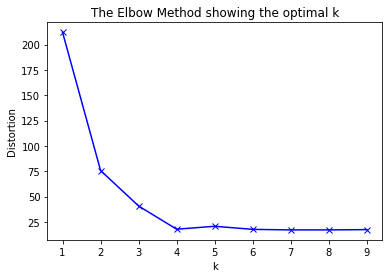

In [32]:
from scipy.spatial.distance import cdist

distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(porto_grouped_clustering)
    #kmeanModel.fit(istanbul_grouped_clustering)
    distortions.append(sum(np.min(cdist(porto_grouped_clustering, kmeanModel.cluster_centers_, 'canberra'), axis=1)) / porto_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [33]:
threshold_scale = np.linspace(porto_merged['unemployment'].min(),
                              porto_merged['unemployment'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_porto_unemployment = folium.Map(location=[41.141127,-8.607638], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = prt,
    name = 'choropleth',
    data = porto_merged,
    columns = ['parish','unemployment'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='unemployment (%)',
    #reset=True
    
    
).add_to(map_clusters_porto_unemployment)

folium.LayerControl().add_to(map_clusters_porto_unemployment)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_porto_unemployment)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lng, poi, cluster in zip(porto_merged['lat'],
                                  porto_merged['lng'],
                                  porto_merged['parish'],
                                  porto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(int(cluster)), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters_porto_unemployment)


In [34]:
threshold_scale = np.linspace(porto_merged['average age'].min(),
                              porto_merged['average age'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_porto_age = folium.Map(location=[41.141127,-8.607638], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = prt,
    name = 'choropleth',
    data = porto_merged,
    columns = ['parish','average age'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='average age',
    #reset=True
    
    
).add_to(map_clusters_porto_age)

folium.LayerControl().add_to(map_clusters_porto_age)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_porto_age)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lng, poi, cluster in zip(porto_merged['lat'],
                                  porto_merged['lng'],
                                  porto_merged['parish'],
                                  porto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(int(cluster)), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters_porto_age)


In [35]:
threshold_scale = np.linspace(porto_merged['pop density'].min(),
                              porto_merged['pop density'].max(),
                              10, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1

map_clusters_porto_popdens = folium.Map(location=[41.141127,-8.607638], zoom_start=11)
choropleth = folium.Choropleth(
    geo_data = prt,
    name = 'choropleth',
    data = porto_merged,
    columns = ['parish','pop density'],
    key_on = 'feature.properties.name',
    threshold_scale=threshold_scale,
    fill_color = 'YlOrRd',
    fill_opacity = 0.7,
    line_opacity = 0.4,
    legend_name='population density (Residents per km^2)',
    #reset=True
    
    
).add_to(map_clusters_porto_popdens)

folium.LayerControl().add_to(map_clusters_porto_popdens)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], labels=False)
).add_to(map_clusters_porto_popdens)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lng, poi, cluster in zip(porto_merged['lat'],
                                  porto_merged['lng'],
                                  porto_merged['parish'],
                                  porto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(int(cluster)), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters_porto_popdens)


## 3 Results <a class="anchor" id="chapter3"></a>

### 3.1 Abrantes <a class="anchor" id="section_3_1"></a>

Abrantes unemployment map:

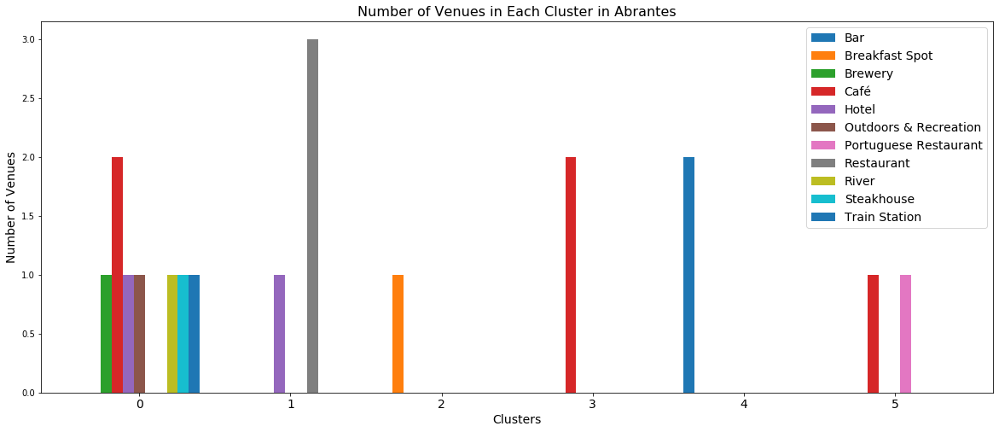

In [55]:
count_venue_abrantes = abrantes_merged
count_venue_abrantes = count_venue_abrantes.drop(['parish','average age','unemployment','lat','lng','distance','pop density'], axis=1)
count_venue_abrantes = count_venue_abrantes.groupby(['Cluster Labels','1st Most Common Venue']).size().reset_index(name='Counts')

#we can transpose it to plot bar chart
cv_cluster_abrantes = count_venue_abrantes.pivot(index='Cluster Labels', columns='1st Most Common Venue', values='Counts')
cv_cluster_abrantesr = cv_cluster_abrantes.fillna(0).astype(int).reset_index(drop=True)
#creating a bar chart of "Number of Venues in Each Cluster"
frame_porto=cv_cluster_abrantes.plot(kind='bar',figsize=(20,8),width = 0.8)

plt.legend(labels=cv_cluster_abrantes.columns,fontsize= 14)
plt.title("Number of Venues in Each Cluster in Abrantes",fontsize= 16)
plt.xticks(fontsize=14)
plt.xticks(rotation=0)
plt.xlabel('Clusters', fontsize=14)
plt.ylabel('Number of Venues', fontsize=14)
plt.savefig('count_venue_abrantes.png')

In [50]:
map_clusters_abrantes_unemployment.save('map_clusters_abrantes_unemployment.html') 
map_clusters_abrantes_unemployment

Abrantes average age map:

In [51]:
map_clusters_abrantes_age.save('map_clusters_abrantes_age.html')
map_clusters_abrantes_age

Abrantes population density map:

In [52]:
map_clusters_abrantes_denspop.save('map_clusters_abrantes_denspop.html')
map_clusters_abrantes_denspop

### 3.2 Tomar <a class="anchor" id="section_3_2"></a>

Tomar unemployment map:

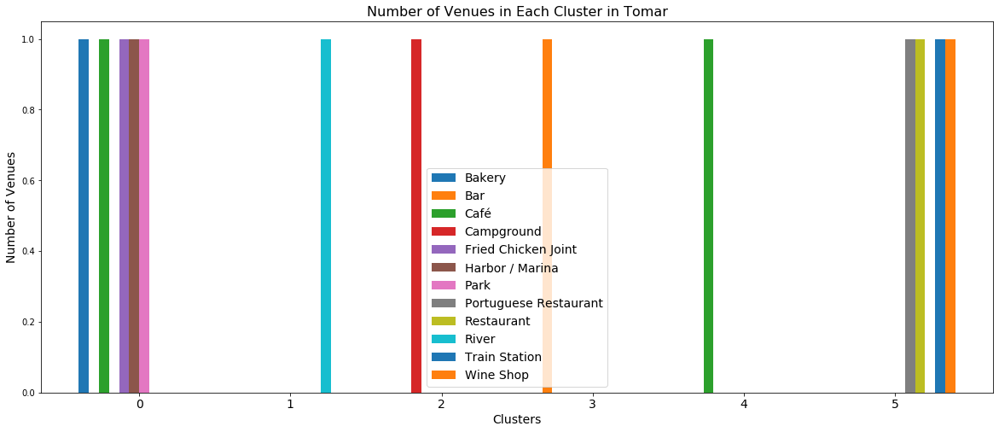

In [56]:
count_venue_tomar = tomar_merged
count_venue_tomar = count_venue_tomar.drop(['parish','average age','unemployment','lat','lng','distance','pop density'], axis=1)
count_venue_tomar = count_venue_tomar.groupby(['Cluster Labels','1st Most Common Venue']).size().reset_index(name='Counts')

#we can transpose it to plot bar chart
cv_cluster_tomar = count_venue_tomar.pivot(index='Cluster Labels', columns='1st Most Common Venue', values='Counts')
cv_cluster_tomar = cv_cluster_tomar.fillna(0).astype(int).reset_index(drop=True)
#creating a bar chart of "Number of Venues in Each Cluster"
frame_porto=cv_cluster_tomar.plot(kind='bar',figsize=(20,8),width = 0.8)

plt.legend(labels=cv_cluster_tomar.columns,fontsize= 14)
plt.title("Number of Venues in Each Cluster in Tomar",fontsize= 16)
plt.xticks(fontsize=14)
plt.xticks(rotation=0)
plt.xlabel('Clusters', fontsize=14)
plt.ylabel('Number of Venues', fontsize=14)
plt.savefig('count_venue_tomar.png')

In [61]:
map_clusters_tomar_unemployment.save('map_clusters_tomar_unemployment.html')
map_clusters_tomar_unemployment 

Tomar average age map:

In [60]:
map_clusters_tomar_age.save('map_clusters_tomar_age.html')
map_clusters_tomar_age

Tomar population density map:

In [62]:
map_clusters_tomar_popdens.save('map_clusters_tomar_popdens.html')
map_clusters_tomar_popdens

### 3.3 Porto <a class="anchor" id="section_3_3"></a>

Porto unemployment map:

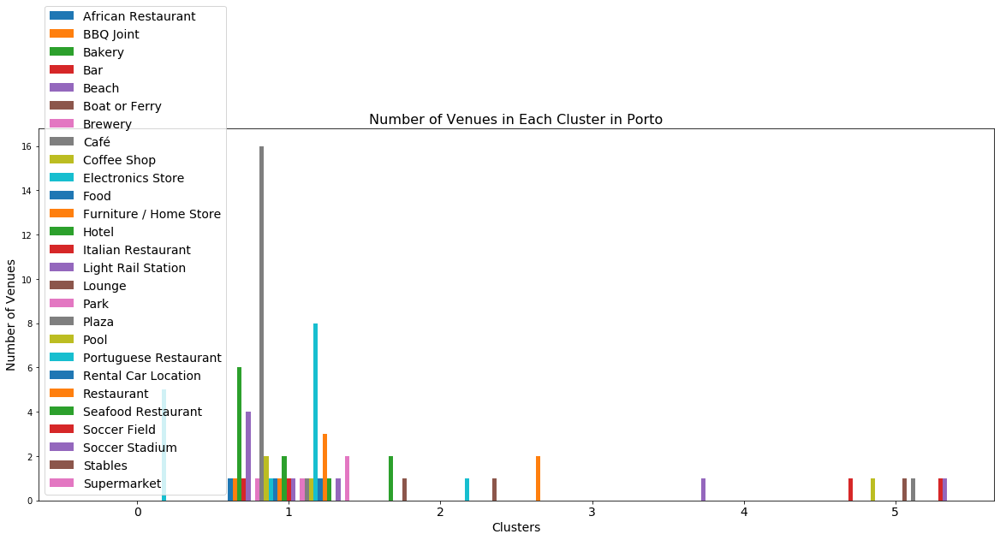

In [57]:
count_venue_porto = porto_merged
count_venue_porto = count_venue_porto.drop(['parish','average age','unemployment','lat','lng','distance','pop density'], axis=1)
count_venue_porto = count_venue_porto.groupby(['Cluster Labels','1st Most Common Venue']).size().reset_index(name='Counts')

#we can transpose it to plot bar chart
cv_cluster_porto = count_venue_porto.pivot(index='Cluster Labels', columns='1st Most Common Venue', values='Counts')
cv_cluster_porto = cv_cluster_porto.fillna(0).astype(int).reset_index(drop=True)
#creating a bar chart of "Number of Venues in Each Cluster"
frame_porto=cv_cluster_porto.plot(kind='bar',figsize=(20,8),width = 0.8)

plt.legend(labels=cv_cluster_porto.columns,fontsize= 14)
plt.title("Number of Venues in Each Cluster in Porto",fontsize= 16)
plt.xticks(fontsize=14)
plt.xticks(rotation=0)
plt.xlabel('Clusters', fontsize=14)
plt.ylabel('Number of Venues', fontsize=14)
plt.savefig('count_venue_porto.png')

In [63]:
map_clusters_porto_unemployment .save('map_clusters_porto_unemployment.html')
map_clusters_porto_unemployment 

Porto average age map:

In [64]:
map_clusters_porto_age.save('map_clusters_porto_age.html')
map_clusters_porto_age 

Porto population density map:

In [65]:
map_clusters_porto_popdens.save('map_clusters_porto_popdens.html')
map_clusters_porto_popdens

## 4 Discussion <a class="anchor" id="chapter4"></a>

### 4.1 Abrantes <a class="anchor" id="section_4_1"></a>

In Abrantes, we have a clear central/more urban cluster, i.e. red cluster 0. We can see that the unemployment rate and the average age bear little weight on how this cluster is located and propagated. This cluster starts in the central area of Abrantes and propagates north.  Potential reasons for this propagation:  
* South of Abrantes is a much more rural area (dominated by forests and farming towns) than north;  
* Northern area has more touristic attractions (riverside areas);    
  
Outside of the central cluster we begin to see more cluster diversity.  
Abrantes used to be a port city, so more investment was made towards the central. With time, people started to leave central areas of Portugal, such as Abrantes, and moved towards the coast and big cities. To fight this tendency, Abrantes invested in touristic area near the nothern river which has interesting views and sites, as well as riverside beaches.

### 4.2 Tomar <a class="anchor" id="section_4_2"></a>

In tomar we see tha same phenomenon as in Abrantes, the existence of a central cluster and its propagation, but this time this propagation is towards East.  
To the south we see a transitory zone, areas where people live between various big cities i.e. Torres Novas, Entroncamento.  
To the north we have more rural areas, dominated by forests and farms.  
Having this in mind, the potential reasons for this propagation of the central cluster towards East may be:  
* Southern parishes being the transitory areas between Tomar and other cities lie Entroncamento and Torres Novas;  
* The East of Tomar is the North of Abrantes and the central clusters of both cities seem to propagate towards the same area, i.e., a more touristic area due to the riverside with interesting views and sites.  
  
North of Tomar we begin to see the cluster diversity we have seen in south of Abrantes.

### 4.3 Porto <a class="anchor" id="section_4_3"></a>

In Porto you we can see the same phenomenom, the propagation of central clusters. Here this propagation seems to be more towards north and coast.  
There seems to be some support by population density closer to the central area and by lower unemployment rate further from the central area.  
Possible reasons for this propagation:  
* Dynamics of the city, the central clusters propagate through the more urban areas which are north and the coast;  
* Propagation seems to be supported also by the lower unemployment rate;  
* The southeastern areas are more rural.  
  
In Porto we can see some possible effects of the unemployment rate, i.e., support of the central clusters propagation.

## 5 Conclusion <a class="anchor" id="chapter5"></a>

We can see some differences in the cities dynamics through this analysis.  
First we see, in all three cities, a central cluster and peripheral clusters:  
* The central cluster begins in the center of the cities, while peripheral clusters do not and exhibit more diversity;
* The central cluster seems to have a propagation outward of the center of the cities whose direction is governed by certain parameters. In tomar and Abrantes these parameters seem to be the local touristic attraction versus the more isolated and abandoned regions, while in porto is the urbanization of the northern and coastal area as well as some effects of the lower unemployment rate in these regions versus higher unemployment rate and less urbanization of the other regions (southeastern regions).

## 6 References <a class="anchor" id="chapter6"></a>

* Data of the parishes borders in JSON format found in Spatial Data Repository of NYU (https://geo.nyu.edu/catalog/stanford-jt394dz4777);
* Region data found in Portuguese Institute of Statistics (https://www.ine.pt/xportal/xmain?xpid=INE&xpgid=ine_main);
* Foursquare API;
* Google Earth;
* Wikipedia.

## 7 Acknowledgements <a class="anchor" id="chapter7"></a>